# Optical flow and depth estimation for Bokeh effect generation
#### ***Brandon Lotero Londoño***
***Universidad Nacional de Colombia, Sede Manizales***

This notebook shows some techniques for producing Bokeh effect on images set based on optical flow strategies.


---
## Optical flow estimation

$$I(x,y,t) = I(x+\Delta x, y+\Delta y, t + \Delta t)$$

$$I(x+\Delta x, y+\Delta y, t + \Delta t) \approx I(x,y,t) + \dfrac{\partial I}{\partial x}\Delta x + \dfrac{\partial I}{\partial y}\Delta y + \dfrac{\partial I}{\partial t}\Delta t$$

$$\dfrac{\partial I}{\partial x}u + \dfrac{\partial I}{\partial y}v + \dfrac{\partial I}{\partial t} = 0$$

$$\nabla I \cdot \vec{V} = -\dfrac{\partial I}{\partial t}$$

In [1]:
import cv2
from matplotlib import pyplot as plt
import numpy as np


---
## Experimental setup

First, a suitable space for capturing stereo image was built. For this, a tripod was disposed on top of a measuring tape as shown: 

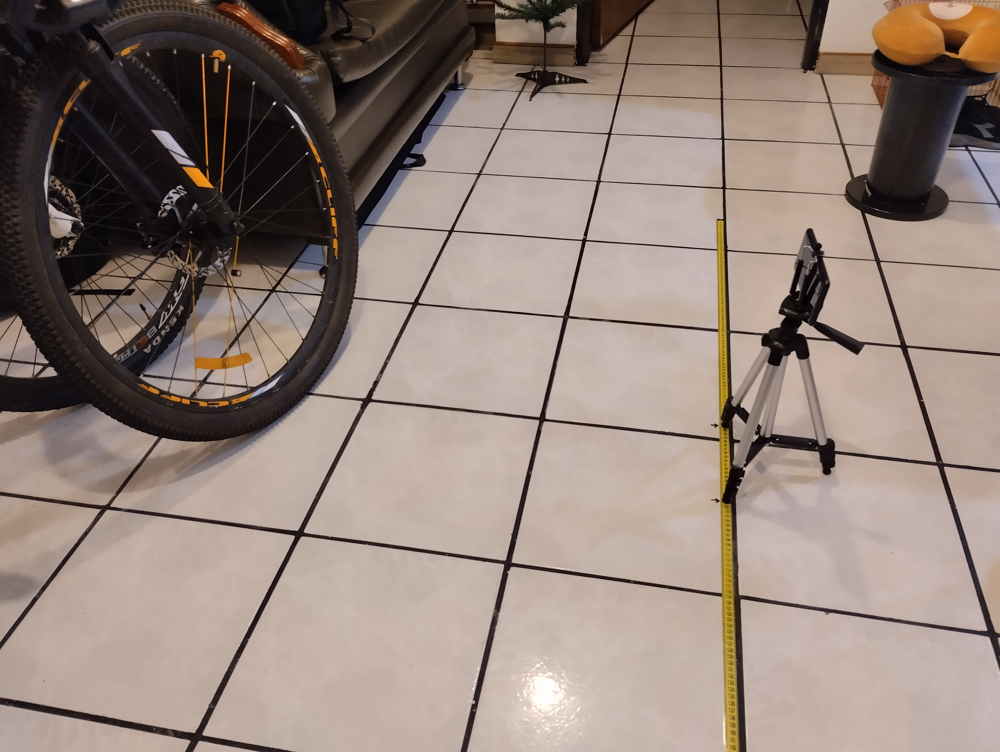


This disposition aids to keep an strict movement along a single axis with a controlled deplacement. 
With the help of some marks on the floor, it was possible to take stereo captures with a controlled separation of 5cm:

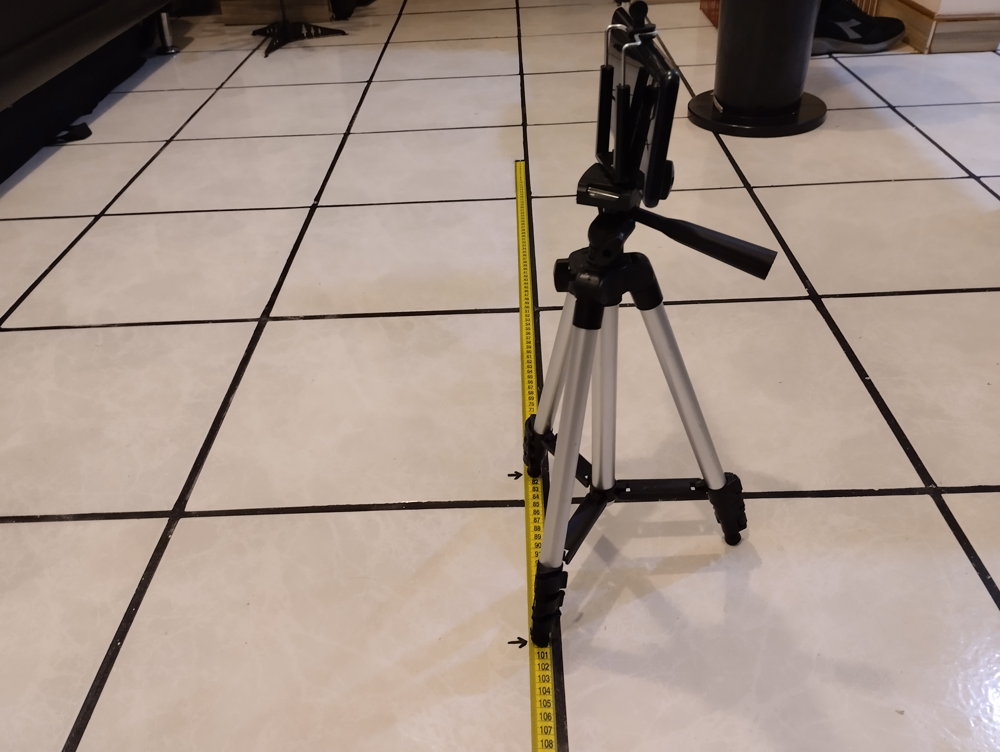

## Loading resulting images

(-0.5, 3263.5, 1471.5, -0.5)

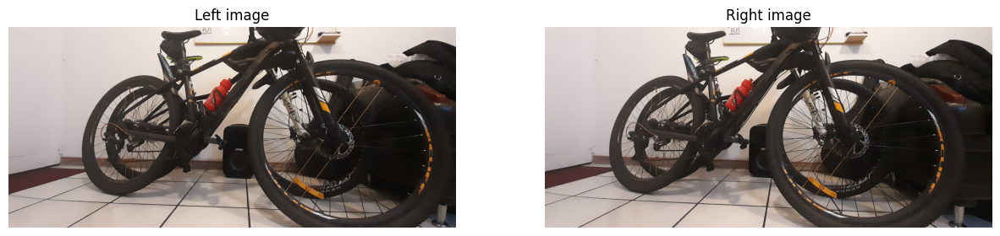

In [2]:
#im = cv2.cvtColor(cv2.imread('s-rl.jpg'), cv2.COLOR_BGR2RGB)
#rows = im.shape[0]
#col2 = int(im.shape[1]/2)

#depth = im.shape[2]

depth = 1

iml = cv2.cvtColor(cv2.imread('bike-l.jpg'), cv2.COLOR_BGR2RGB)
imr = cv2.cvtColor(cv2.imread('bike-r.jpg'), cv2.COLOR_BGR2RGB)
plt.figure(figsize=[15, 14])
plt.subplot(121)
plt.imshow(iml)
plt.title("Left image")
plt.axis('off')
plt.subplot(122)
plt.imshow(imr)
plt.title("Right image")
plt.axis('off')

---
# Depth estimation using Stereo Block Matching (StereoBM)

The stereo block matching algorithm assumes that the corresponding pixels in the left and right images are found along a scanline, hence sharing the same Y coordinate. Since more than one pixel may match the intensity of the source pixel, the algorithm tries to find the best match to a block centered in such pixel along the scanline in the second image. For more information please refer to the OpenCV documentation, or check the page in [this link](https://learnopencv.com/depth-perception-using-stereo-camera-python-c/).

In order to use the OpenCV StereoBM::compute, both left and right images should be transformed into 8 bit unsigned with only one plane depth.

(-0.5, 3263.5, 1471.5, -0.5)

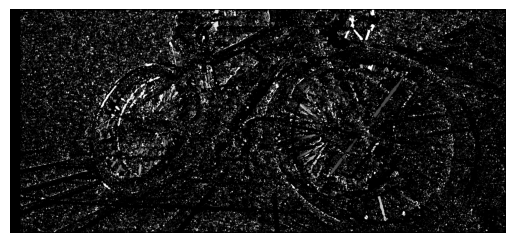

In [3]:
stereo = cv2.StereoBM_create(numDisparities=64, blockSize=11)
disparity = stereo.compute(cv2.cvtColor(iml, cv2.COLOR_RGB2GRAY), \
                           cv2.cvtColor(imr, cv2.COLOR_RGB2GRAY))
plt.imshow(disparity, 'gray')
plt.axis('off')

---
## Global optical flow calculation using the [Farnebäck method](https://www.diva-portal.org/smash/get/diva2:273847/FULLTEXT01.pdf)



(-0.5, 3263.5, 1471.5, -0.5)

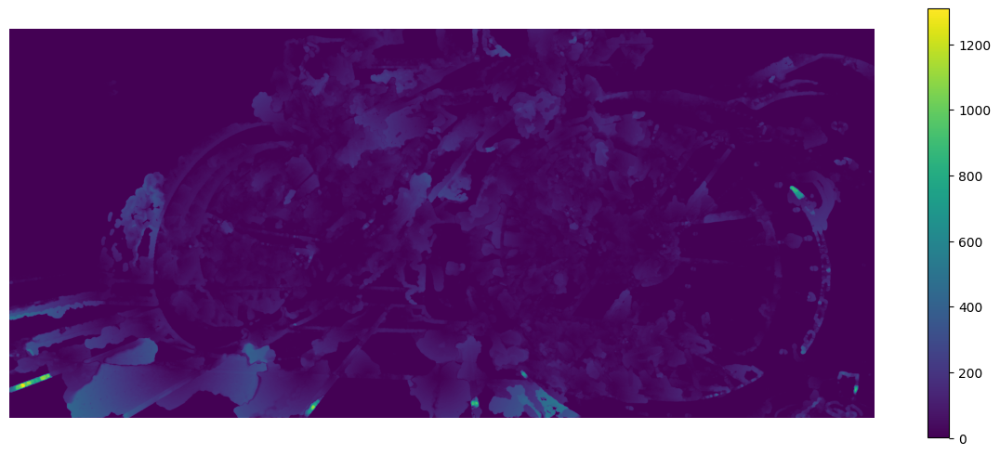

In [4]:
flow = cv2.calcOpticalFlowFarneback(cv2.cvtColor(iml, cv2.COLOR_RGB2GRAY), \
                               cv2.cvtColor(imr, cv2.COLOR_RGB2GRAY), flow=None, \
                               pyr_scale=0.5, levels=3, iterations=15, winsize=11, \
                               poly_n=5, poly_sigma=1.1, flags=cv2.OPTFLOW_FARNEBACK_GAUSSIAN)
magflow = np.sqrt(np.sum(flow*flow, axis=2))
plt.figure(figsize=(15,6))
plt.imshow(magflow)
plt.colorbar()
plt.axis("off")

In [5]:
#Visualizing resulting shape
flow.shape

(1472, 3264, 2)

## Blur application based on estimated optical flow

Now that we have optical flow magnitud for every pixel of the image, we can apply a Gaussian blur proportional to this magnitude.

For this, we will create sub windows of a fixed size and build every of the blur transformation of these windows based on the mean optical flow magnitude in this region.

In other words, we can modify standard deviation of the Gaussian Blur for every pixel neighborhood based on the average optical flow intensity of this region.
This assumption will lead to an effect of camera focus on closest objects.

Let's put this into action by  testing in a couple of isolated regions...

In [6]:
from ipywidgets import interact

@interact(initPointX = (0,flow.shape[0],1),
          initPointY = (0,flow.shape[0],1),
          winSizeX = (0,200,11),
          winSizeY = (0,200,1),
         )

def visualizeBlurFromRegion(initPointX, initPointY, winSizeX, winSizeY):
    imageRegion = iml[initPointX:initPointX+winSizeX,initPointY:initPointY+winSizeY]
    flowMagnitudeRegion = magflow[initPointX:initPointX+winSizeX,initPointY:initPointY+winSizeY]    
    meanFlowMagnitude = flowMagnitudeRegion.mean()
    scalingFactor = 50
    gaussian = cv2.GaussianBlur(imageRegion, (15, 15),sigmaX = meanFlowMagnitude/scalingFactor)
    

    plt.figure(figsize=(20,6))    
    plt.subplot(131)
    plt.imshow(imageRegion)
    plt.title("Image region")
    plt.subplot(132)
    plt.title("Optical flow magnitude region")
    plt.imshow(flowMagnitudeRegion)
    plt.subplot(133)
    plt.imshow(gaussian)
    plt.title("Resulting blur")
    plt.show()
    print(f"Average optical flow magnitude in selected region: {meanFlowMagnitude:.3e}")

interactive(children=(IntSlider(value=736, description='initPointX', max=1472), IntSlider(value=736, descripti…

## Modeling construction of final image (no overlap solution)


An initial purposed solution would be to construct the final images by puting together all transformed frames without overlap. 

Let:

$$\mathbf{X}_f = \mathbf{X}_{(x_i,y_i)}^{(x_j,y_j)}$$

Be an input frame from the original image $\mathbf{X}$ between points $(x_i,y_i)$ and $(x_j,y_j)$, where $w_x = x_j - x_i$ and $w_y = y_j - y_i$ are the corresponding frame widths for this region.


For every frame, the resulting blured output frame will be as follows:

$$\mathbf{Y}_f = \mathcal{G}(\mathbf{X}_f,\mathbf{K}, \sigma_x, \sigma_y)$$

Where: 

$\mathcal{G}$ is a Gaussian blur operation, 

$\mathbf{K}$ is the transformation Kernel, 

$\sigma_x$ is the standard deviation in the X axis, and

$\sigma_y$ is the standard deviation in the Y axis.

If we asume an equal standard deviation in both axis, we can rewrite:

$$\mathbf{Y}_f = \mathcal{G}(\mathbf{X}_f,\mathbf{K}, \sigma)$$

Now, we can obtain $\sigma$ from some sort of transformation of the optical flow.

Let:

$$\mathbf{F}_f = \mathbf{F}_{(x_i,y_i)}^{(x_j,y_j)}$$

Be a frame from the opical flow magnitude previously obtained from the source images. 

Let $\bar{\mathbf{F}}_f$ be the average magnitude of the optical flow in a certain frame.

Then, we can model the Gaussian blur transformation standard deviation ($\sigma$) based on this average magnitude as follows:

$$\sigma  = \Phi(\bar{\mathbf{F}}_f)$$

Where $\Phi$ is some transformation function.

In the previous code cell, we asumed $\Phi$ as a linear function, defined as:

$$\Phi(\bar{\mathbf{F}}_f) = \frac{1}{\alpha} \bar{\mathbf{F}}_f$$

Where $\alpha$ is a scaling factor that handles the sensitivity of bluring by changes in depth.

Finally, we can reconstruct the full output image ($\mathbf{Y}$) based on the several output windows obtained with these rules by applying the same geometrical behavior from the input:

$$\mathbf{Y}_f = \mathbf{Y}_{(x_i,y_i)}^{(x_j,y_j)}$$

Let's put this in practice...

In [7]:
def buildBokehFromFlow(winSizeX, winSizeY, inputShape, sourceIm, magnitudeFlow, phi = None, scalingFactor = 50):      
    """
    Input parameters:
        winSizeX: window size in x axis
        winSizeY: window size in y axis
        inputShape: input shape
        sourceIm: source image in which blur and subframes will be obtained
        magnitudeFlow: previously calculated magnitudes of optical flow
        phi: transformation function for obtaining sigma (linear by default)
        scalingFactor: scaling factor to use in linear Phi transformation

    Output:
        outputImage, sigma_list
    """
    if (winSizeX < 32 or winSizeY < 32):
        raise Exception("Winsizes cannot be smaller than 32")
    buildPointsX = np.linspace(0,inputShape[0] - winSizeX ,int(inputShape[0] / winSizeX)+1).astype(np.int32)
    buildPointsY = np.linspace(0,inputShape[1] - winSizeY, int(inputShape[1] / winSizeY)+1).astype(np.int32)
    outputImage = np.zeros(inputShape)
    sigma_list = []

    for yPoint in buildPointsY:
        for xPoint in buildPointsX:
            imageRegion = sourceIm[xPoint:xPoint+winSizeX,yPoint:yPoint+winSizeY]    
            flowMagnitudeRegion = magnitudeFlow[xPoint:xPoint+winSizeX,yPoint:yPoint+winSizeY]    
            meanFlowMagnitude = flowMagnitudeRegion.mean()
            if phi:
                sigma = phi(meanFlowMagnitude)
            else:
                sigma = meanFlowMagnitude/scalingFactor                
            sigma_list.append(sigma)            
            gaussianFrame = cv2.GaussianBlur(imageRegion, (11, 11), sigmaX = sigma )
            outputImage[xPoint:xPoint+winSizeX,yPoint:yPoint+winSizeY] = gaussianFrame

    return outputImage.astype(np.uint8), sigma_list
   

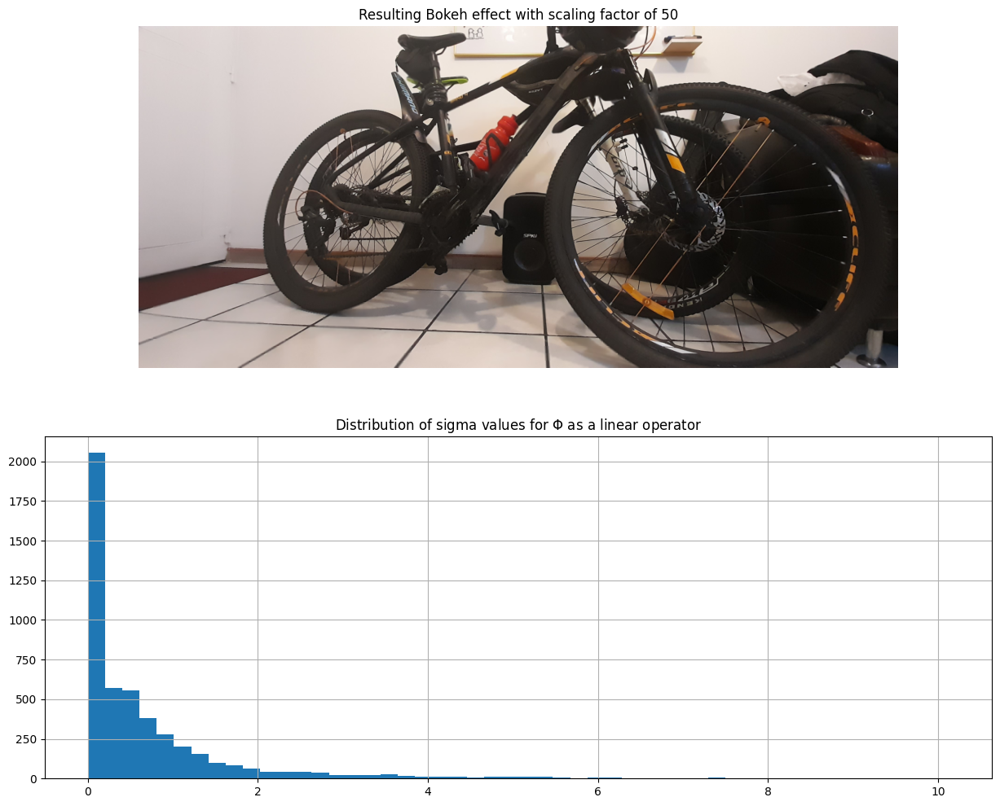

In [8]:
outputImage, sigmaList = buildBokehFromFlow(32, 32, iml.shape, iml, magflow)
plt.figure(figsize = (15,12))
plt.subplot(211)
plt.imshow(outputImage)
plt.title("Resulting Bokeh effect with scaling factor of 50")
plt.axis("off")
plt.subplot(212)
plt.hist(sigmaList, bins=50)
plt.grid()
plt.title("Distribution of sigma values for $\Phi$ as a linear operator")
plt.show()

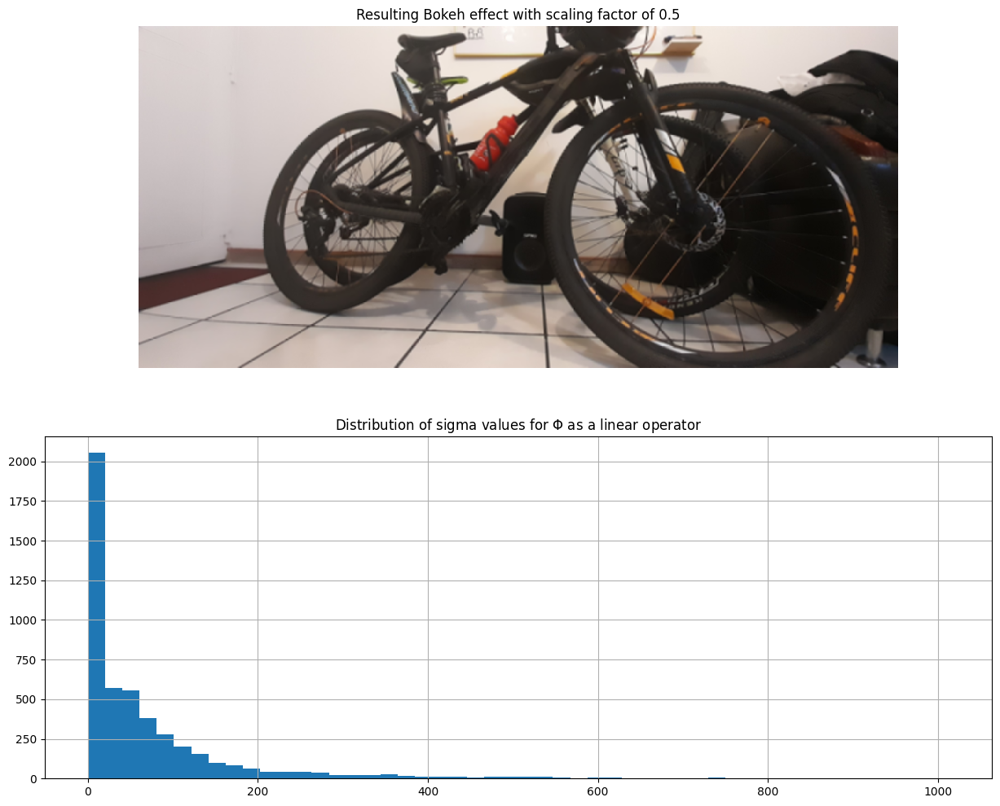

In [9]:
outputImage, sigmaList = buildBokehFromFlow(32, 32, iml.shape, iml, magflow, scalingFactor = 0.5)
plt.figure(figsize = (15,12))
plt.subplot(211)
plt.imshow(outputImage)
plt.title("Resulting Bokeh effect with scaling factor of 0.5")
plt.axis("off")
plt.subplot(212)
plt.hist(sigmaList, bins=50)
plt.grid()
plt.title("Distribution of sigma values for $\Phi$ as a linear operator")
plt.show()

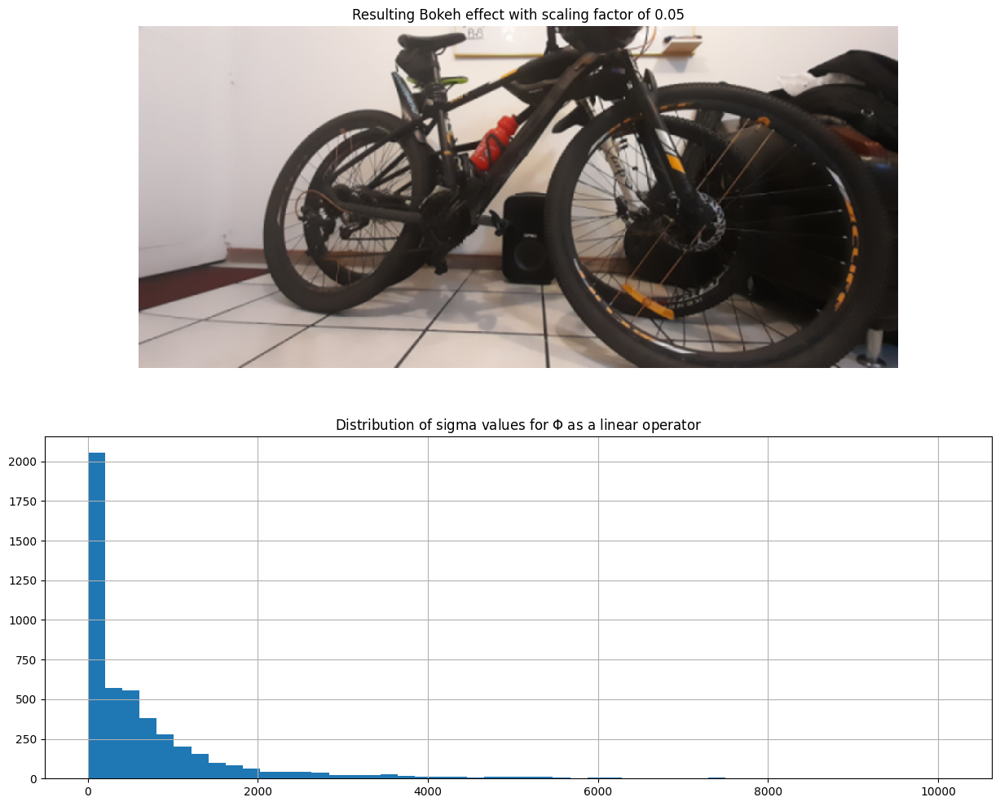

In [10]:
outputImage, sigmaList = buildBokehFromFlow(32, 32, iml.shape, iml, magflow, scalingFactor = 0.05)
plt.figure(figsize = (15,12))
plt.subplot(211)
plt.imshow(outputImage)
plt.title("Resulting Bokeh effect with scaling factor of 0.05")
plt.axis("off")
plt.subplot(212)
plt.hist(sigmaList, bins=50)
plt.grid()
plt.title("Distribution of sigma values for $\Phi$ as a linear operator")
plt.show()

As we can see, using a linear transformation for obtaining the sigma for the Gaussian blur results in a very unequal distribution of standard deviations across all frames, leading to a barely noticeable  sense of depth. Let's modify Phi and see if we can percieve any changes...

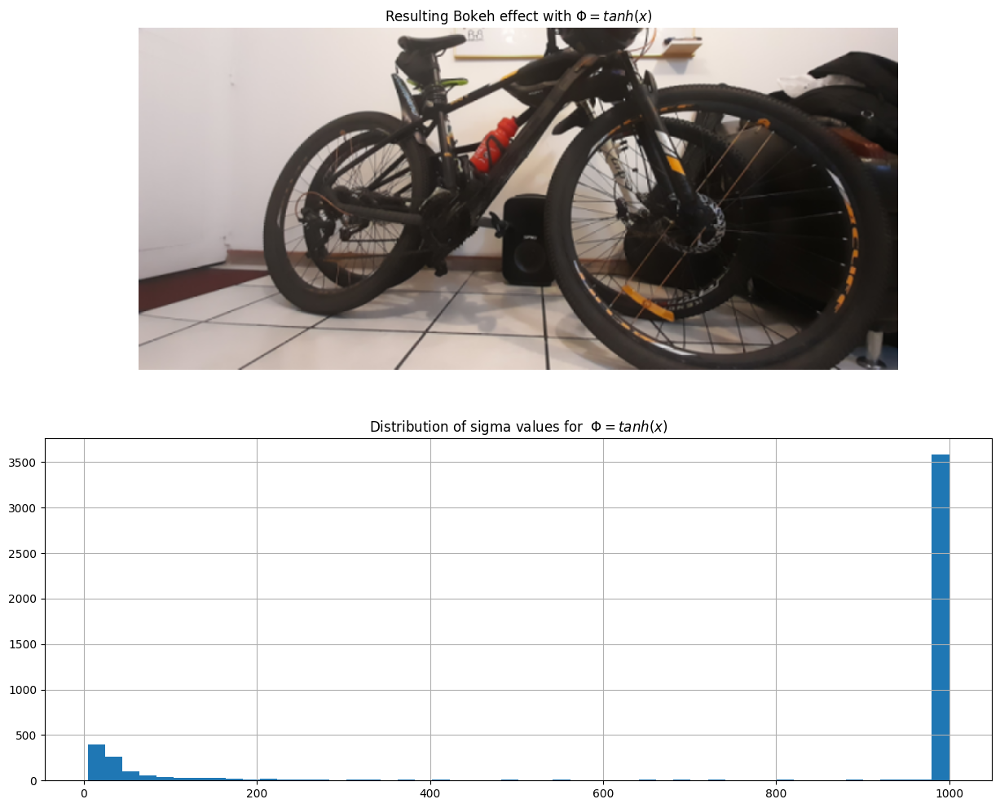

In [11]:
def tanh(x):
    a = 10
    b = 1000
    return np.tanh(a*x)*b

outputImage, sigmaList = buildBokehFromFlow(32, 32, iml.shape, iml, magflow, phi=tanh)
plt.figure(figsize = (15,12))
plt.subplot(211)
plt.imshow(outputImage)
plt.title("Resulting Bokeh effect with $\Phi = tanh (x) $")
plt.axis("off")
plt.subplot(212)
plt.hist(sigmaList, bins=50)
plt.grid()
plt.title("Distribution of sigma values for  $\Phi = tanh (x) $")
plt.show()

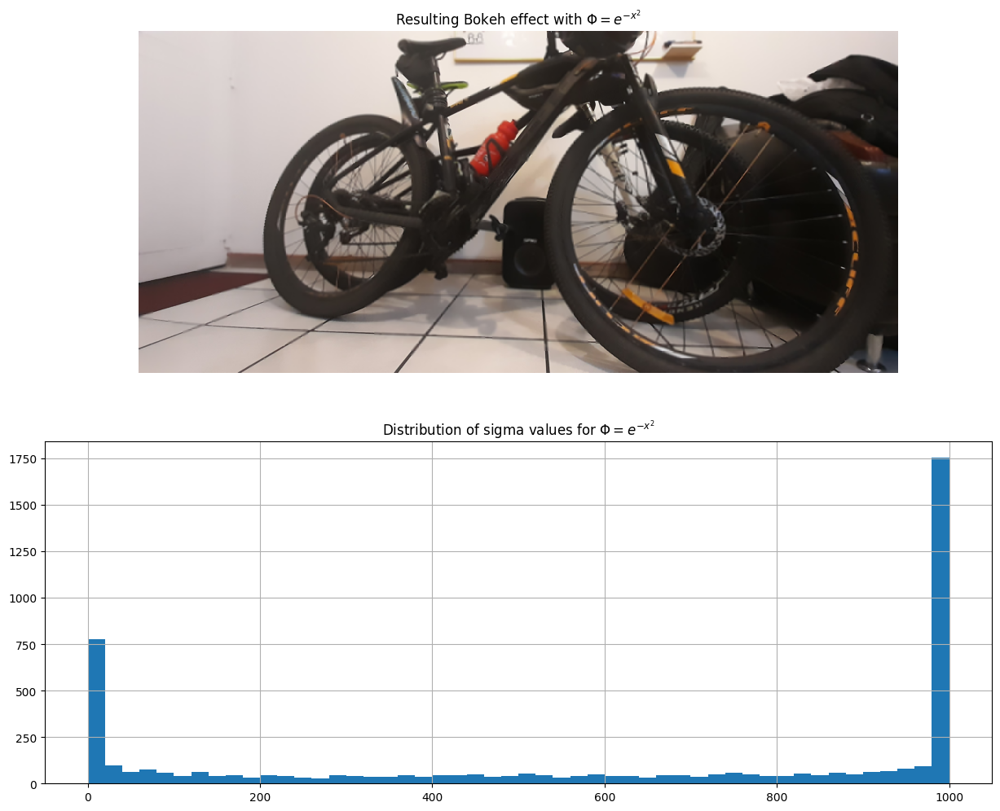

In [12]:
def expsqrminusx(x):
    a = 0.001
    b = 1000
    return np.exp(-a*x**2)*b

outputImage, sigmaList = buildBokehFromFlow(32, 32, iml.shape, iml, magflow, phi=expsqrminusx)
plt.figure(figsize = (15,12))
plt.subplot(211)
plt.imshow(outputImage)
plt.title("Resulting Bokeh effect with $\Phi = e^{-x^2} $")
plt.axis("off")
plt.subplot(212)
plt.hist(sigmaList, bins=50)
plt.grid()
plt.title("Distribution of sigma values for $\Phi = e^{-x^2}$")
plt.show()

### *Acknowledgements:*
Juan Bernardo Gómez Mendoza
***Universidad Nacional de Colombia, Sede Manizales***